<b><center>Linear Regression Template</center></b>
<pre>
<b>Topics to be Covered</b>
<a href='#1'>Assumption 1: There should be no outliers in the data-->boxplot()</a>
<a href='#2'>Assumption 2: Assumption of Linearity:Every ind var should have a linear relationship with the dep var-->pairplot()</a>
<b><a href='#st1'>Step 1:- Create X and Y-->X=ind var, Y=dep var</a></b>
<a href='#3'>Assumption 3: Assumption of Normality: The dependent variable should follow an approximate normal distribtion</a>
<a href='#4'> Assumption 4: Assumption of no multicollinearity</a>
<b><a href='#st2'>Step 2:- Splitting the data into train and test(validation)</a></b>
<b><a href='#st3'>Step 3:- Creating a model</a></b>
<a href='#st4'><b>Step 4:- Regularization</b></a>
<a href='#st5'><b>Step 5:- Evaluation</b></a>
Assumption 5: There should be no auto-correlation in the data-->Durbin Watson test--not used
<a href='#6'>Assumption 6: Errors should be random-->Fitted v/s Residual plot</a>
<a href='#7'>Assumption 7: Errors should follow an approx normal distribution-->Normal QQ plot</a>
<a href='#8'>Assumption 8: Errors should should follow a constant variance(Homoskedasticity)-->Scale Location plot</a>
</pre>

In [1]:
#Import modules
import pandas as pd
import numpy as np
from utils import *

In [2]:

df=pd.read_csv(r"Files\HousePrices.csv",index_col=0)
df.head()

,Dwell_Type,Zone_Class,LotFrontage,LotArea,Road_Type,Alley,Property_Shape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,Property_Sale_Price
Id,,,,,,,,,,,,,,,,,,,,,
1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [3]:
utils=utils(df)
utils.basics()

Shape of the Dataframe:- 

Rows:-  2073
Columns:-  80

________________________________________________________________________________________________________

Columns of the Dataframe:-

columns:- Index(['Dwell_Type', 'Zone_Class', 'LotFrontage', 'LotArea', 'Road_Type',
       'Alley', 'Property_Shape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'Dwelling_Type', 'HouseStyle', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond',
       'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
       'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF',
       '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath',
       'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr'

In [4]:
pd.set_option("display.max_rows", None)
utils.datatypes_data()

,Column_Name,datatype,unique,sample_value_of_the_column,Number_of_missing_value_present
0,Dwell_Type,int64,18,60,0
1,Zone_Class,object,5,RL,0
2,LotFrontage,float64,110,65.0,320
3,LotArea,int64,1367,8450,0
4,Road_Type,object,2,Pave,0
5,Alley,object,2,NaN,1944
6,Property_Shape,object,4,Reg,0
7,LandContour,object,4,Lvl,0
8,Utilities,object,2,AllPub,0
9,LotConfig,object,5,Inside,0


In [5]:
utils.missing()

,column name,datatype,unique,sample_value_of_the_column,Missing values,Missing percentage,category_
71,PoolQC,object,3,NaN,2065,100%,Categorical(mode)
73,MiscFeature,object,4,NaN,1993,96%,Categorical(mode)
5,Alley,object,2,NaN,1944,94%,Categorical(mode)
72,Fence,object,4,NaN,1669,81%,Categorical(mode)
56,FireplaceQu,object,5,NaN,988,48%,Categorical(mode)
2,LotFrontage,float64,110,65.0,320,15%,Continous(mean/median)
58,GarageYrBlt,float64,102,2003.0,113,5%,Continous(mean/median)
63,GarageCond,object,5,TA,113,5%,Categorical(mode)
57,GarageType,object,6,Attchd,113,5%,Categorical(mode)
59,GarageFinish,object,3,RFn,113,5%,Categorical(mode)


In [6]:
df.drop_duplicates(inplace=True)

In [7]:
df.drop(['Alley','FireplaceQu','PoolQC','Fence','MiscFeature'],axis=1,inplace=True)

In [8]:
utils.missing()

,column name,datatype,unique,sample_value_of_the_column,Missing values,Missing percentage,category_
2,LotFrontage,float64,110,65.0,317,15%,Continous(mean/median)
55,GarageType,object,6,Attchd,113,5%,Categorical(mode)
56,GarageYrBlt,float64,102,2003.0,113,5%,Continous(mean/median)
57,GarageFinish,object,3,RFn,113,5%,Categorical(mode)
60,GarageQual,object,5,TA,113,5%,Categorical(mode)
61,GarageCond,object,5,TA,113,5%,Categorical(mode)
30,BsmtExposure,object,4,No,60,3%,Categorical(mode)
33,BsmtFinType2,object,6,Unf,59,3%,Categorical(mode)
28,BsmtQual,object,4,Gd,58,3%,Categorical(mode)
29,BsmtCond,object,4,TA,58,3%,Categorical(mode)


In [9]:
utils.fill_mean_mode()

In [10]:
utils.missing()
#No missing values

,column name,datatype,unique,sample_value_of_the_column,Missing values,Missing percentage,category_
0,Dwell_Type,int64,18,60,0,0%,Continous(mean/median)
56,GarageYrBlt,float64,103,2003.0,0,0%,Continous(mean/median)
54,Fireplaces,int64,4,0,0,0%,Discrete(mode)
53,Functional,object,7,Typ,0,0%,Categorical(mode)
52,TotRmsAbvGrd,int64,12,8,0,0%,Continous(mean/median)
51,KitchenQual,object,4,Gd,0,0%,Categorical(mode)
50,KitchenAbvGr,int64,4,1,0,0%,Discrete(mode)
49,BedroomAbvGr,int64,8,3,0,0%,Discrete(mode)
48,HalfBath,int64,3,1,0,0%,Discrete(mode)
47,FullBath,int64,4,2,0,0%,Discrete(mode)


In [11]:
print(utils.check_missing())

No Missing value present


<div id='1'><b>Assumption 1: There should be no outliers in the data-->boxplot()</b></div>

In [12]:
outlier_col=utils.get_outlier_col()
outlier_col

Dwell_Type
Outliers:-  148
LotFrontage
Outliers:-  141
LotArea
Outliers:-  136
OverallQual
Outliers:-  23
OverallCond
Outliers:-  6
YearBuilt
Outliers:-  2
YearRemodAdd
No Outliers
MasVnrArea
Outliers:-  143
BsmtFinSF1
Outliers:-  12
BsmtFinSF2
Outliers:-  3877
BsmtUnfSF
Outliers:-  41
TotalBsmtSF
Outliers:-  86
1stFlrSF
Outliers:-  26
2ndFlrSF
Outliers:-  2
LowQualFinSF
Outliers:-  4081
GrLivArea
Outliers:-  39
BsmtFullBath
Outliers:-  2
BsmtHalfBath
Outliers:-  4006
FullBath
No Outliers
HalfBath
No Outliers
BedroomAbvGr
Outliers:-  48
KitchenAbvGr
Outliers:-  4015
TotRmsAbvGrd
Outliers:-  114
Fireplaces
Outliers:-  5
GarageYrBlt
Outliers:-  1
GarageCars
Outliers:-  6
GarageArea
Outliers:-  30
WoodDeckSF
Outliers:-  50
OpenPorchSF
Outliers:-  112
EnclosedPorch
Outliers:-  3839
3SsnPorch
Outliers:-  4088
ScreenPorch
Outliers:-  3960
PoolArea
Outliers:-  4112
MiscVal
Outliers:-  4044
MoSold
No Outliers
YrSold
No Outliers
Property_Sale_Price
Outliers:-  78


['Dwell_Type',
 'LotFrontage',
 'LotArea',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageYrBlt',
 'GarageCars',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'Property_Sale_Price']

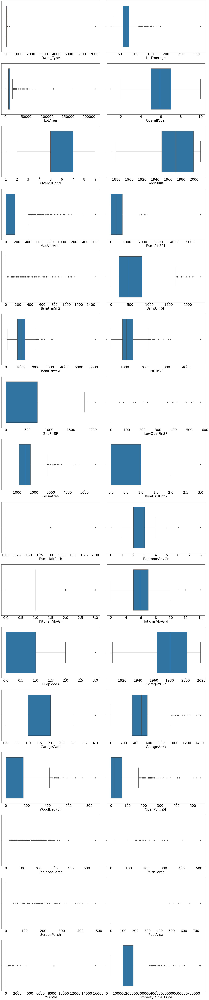

In [13]:
##### import seaborn as sns
utils.out_vis(outlier_col)

In [14]:
df=df[df['Dwell_Type']<250]
# sns.boxplot(df['Dwell_Type'])

In [15]:
df=df[df['LotFrontage']<200]
# sns.boxplot(df['LotFrontage'])

In [16]:
df=df[df['LotArea']<150000]
# sns.boxplot(df['LotArea'])

In [17]:
df=df[df['BsmtFinSF1']<5000]
# sns.boxplot(df['BsmtFinSF1'])

In [18]:
df=df[df['TotalBsmtSF']<5000]
# sns.boxplot(df['TotalBsmtSF'])

In [19]:
df=df[df['1stFlrSF']<4000]
# sns.boxplot(df['1stFlrSF'])

In [20]:
df=df[df['BsmtFullBath']<2.5]
# sns.boxplot(df['BsmtFullBath'])

In [21]:
df=df[df['BsmtHalfBath']<0.75]
# sns.boxplot(df['BsmtHalfBath'])

In [22]:
df=df[df['MiscVal']<8000]
# sns.boxplot(df['MiscVal'])

<div id='2'><b>Assumption 2: Assumption of Linearity:Every ind var should have a linear relationship with the dep var-->pairplot()</b></div>

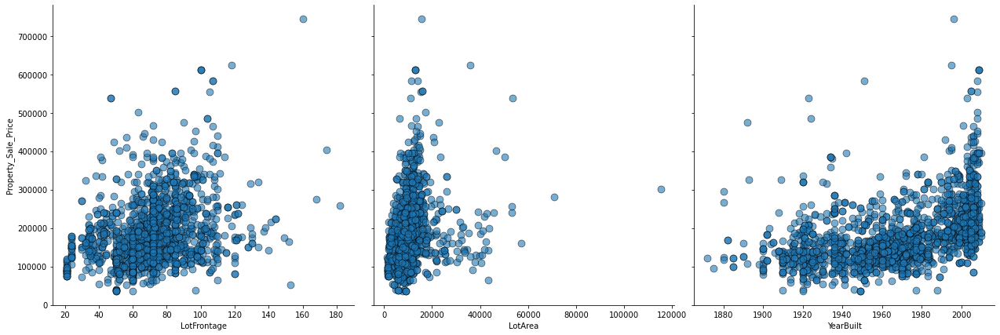

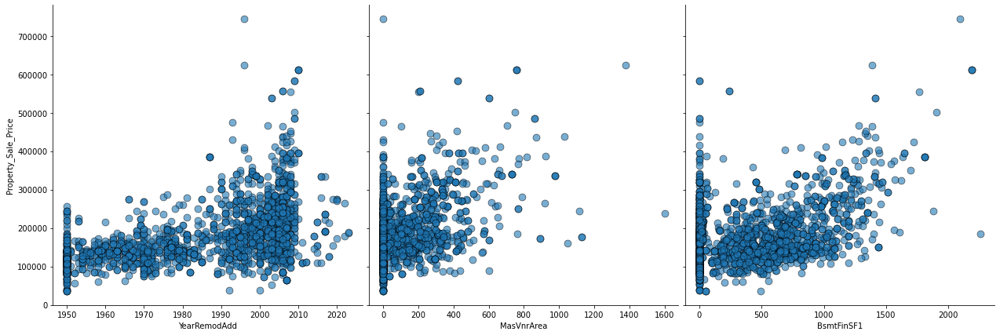

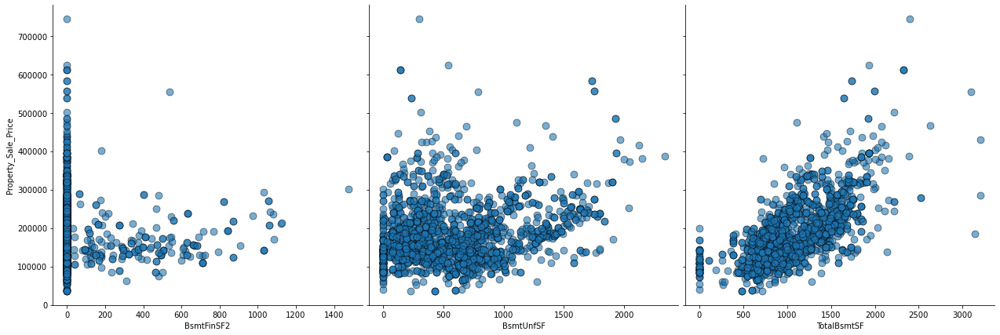

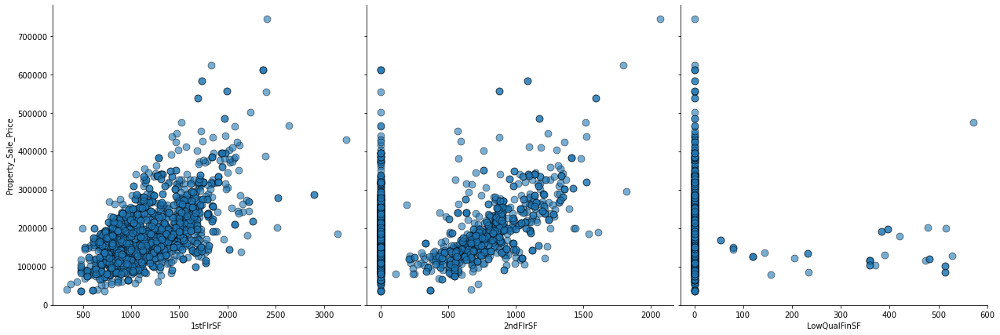

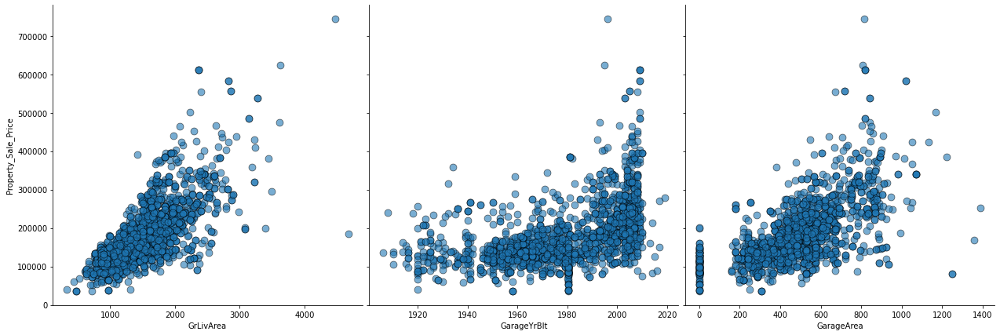

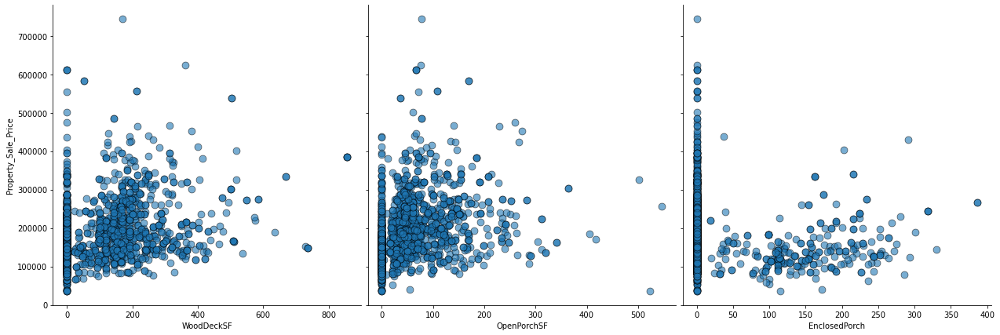

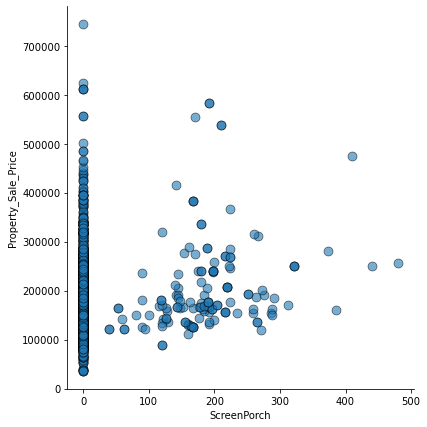

In [23]:
#Linear plot for outliers
def lin_vis(num):
    
    len_num=len(num)
    qu=round(len_num/3)
    re=round(len_num%3)
    
    i=0
    j=3
    for itr in range(qu):
        sns.pairplot(data=df,x_vars=num[i:j],y_vars='Property_Sale_Price',palette='Dark2', plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},size=6)
        i=i+3
        j=j+3
    if re!=0:
        sns.pairplot(data=df,x_vars=num[i:],y_vars='Property_Sale_Price',palette='Dark2', plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},size=6)

def continous(df):
    num=df.select_dtypes(exclude='object')
    num=num.columns    
    num=num.to_list()
    num.pop()
    con=[]
    for itr in num:
        if df[itr].nunique()>20:
            con.append(itr)
    return con

con=continous(df)
lin_vis(con)

In [24]:
df.drop(['LowQualFinSF','GarageArea','WoodDeckSF','OpenPorchSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','MiscVal'],axis=1)

,Dwell_Type,Zone_Class,LotFrontage,LotArea,Road_Type,Property_Shape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,Dwelling_Type,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageQual,GarageCond,PavedDrive,MoSold,YrSold,SaleType,SaleCondition,Property_Sale_Price
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,60,RL,65.000000,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.000000,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,1710,1,0,2,1,3,1,Gd,8,Typ,0,Attchd,2003.000000,RFn,2,TA,TA,Y,2,2008,WD,Normal,208500
3,60,RL,68.000000,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.000000,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,1786,1,0,2,1,3,1,Gd,6,Typ,1,Attchd,2001.000000,RFn,2,TA,TA,Y,9,2008,WD,Normal,223500
4,70,RL,60.000000,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.000000,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,1717,1,0,1,0,3,1,Gd,7,Typ,1,Detchd,1998.000000,Unf,3,TA,TA,Y,2,2006,WD,Abnorml,140000
5,60,RL,84.000000,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.000000,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,2198,1,0,2,1,4,1,Gd,9,Typ,1,Attchd,2000.000000,RFn,3,TA,TA,Y,12,2008,WD,Normal,250000
6,50,RL,85.000000,14115,Pave,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.000000,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,1362,1,0,1,1,1,1,TA,5,Typ,0,Attchd,1993.000000,Unf,2,TA,TA,Y,10,2009,WD,Normal,143000
7,20,RL,75.000000,10084,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.000000,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Attchd,2004.000000,RFn,2,TA,TA,Y,8,2007,WD,Normal,307000
8,60,RL,72.052209,10382,Pave,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.000000,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,2090,1,0,2,1,3,1,TA,7,Typ,2,Attchd,1973.000000,RFn,2,TA,TA,Y,11,2009,WD,Normal,200000
9,50,RM,51.000000,6120,Pave,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.000000,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,1774,0,0,2,0,2,2,TA,8,Min1,2,Detchd,1931.000000,Unf,2,Fa,TA,Y,4,2008,WD,Abnorml,129900
10,190,RL,50.000000,7420,Pave,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,None,0.000000,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,GasA,Ex,Y,SBrkr,1077,0,1077,1,0,1,0,2,2,TA,5,Typ,2,Attchd,1939.000000,RFn,1,Gd,TA,Y,1,2008,WD,Normal,118000


In [25]:
df.shape

(1929, 75)

<div id='st1'><b>Step 1:-Create X and Y-->X=ind var, Y=dep var</b></div>

In [26]:
x=df.drop('Property_Sale_Price',axis=1)
y=df['Property_Sale_Price']

<div id='check'><b>Checking catogorical variable:- removing bias columns </b></div>

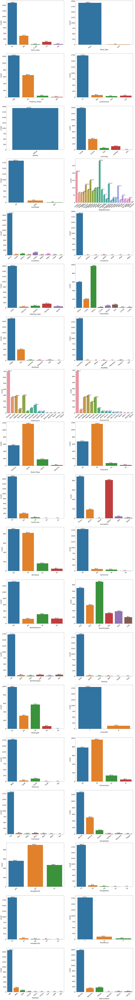

In [27]:
x1=df.select_dtypes(include='object')
len_outlier_col=len(x1.columns)
col=round(len_outlier_col/2)
fig, ax1 = plt.subplots(col,2,figsize=(30,240))
i=0
j=0
for itr in x1.columns:
    
    
    ax=sns.countplot(df[itr],ax=ax1[j,i])
    ax1[j,i].tick_params(axis="x", labelsize=20,rotation=40) 
    ax1[j,i].tick_params(axis="y", labelsize=20) 
    ax1[j,i].set_xlabel(itr, fontsize = 20)
    ax1[j,i].set_ylabel("COUNT", fontsize = 17)
        
#     plt.set_xlabel(itr, fontsize = 27)
    for p in ax.patches:
        
        ax.annotate('{:.1f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01), fontsize=17)
    if i==1:
        j+=1
        i=0
    else:
        i=i+1
plt.show()
#Road_Type,Utilities,

In [28]:
x.drop(['Road_Type','Utilities'],axis=1,inplace=True)

<div id='con'><b>Converting categorical to numerical </b></div>

In [29]:
#Converting categorical to numerical:-Here we used label encoder
from sklearn import preprocessing
#df:-dataframe x1:-columns
def label_enocder_of_df(df,x1):
    for itr in x1.columns:
        label_encoder = preprocessing.LabelEncoder()

        # Encode labels in column 'species'.
        x[itr]= label_encoder.fit_transform(x[itr])
    return x.head()
x1=x.select_dtypes(include='object')
label_enocder_of_df(x,x1)

,Dwell_Type,Zone_Class,LotFrontage,LotArea,Property_Shape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,Dwelling_Type,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,60,3,65.0,8450,3,3,4,0,5,2,2,0,5,7,5,2003,2003,1,0,12,13,1,196.0,2,4,2,2,3,3,2,706,5,0,150,856,1,0,1,4,856,854,0,1710,1,0,2,1,3,1,2,8,6,0,1,2003.0,1,2,548,4,4,2,0,61,0,0,0,0,0,2,2008,8,4
3,60,3,68.0,11250,0,3,4,0,5,2,2,0,5,7,5,2001,2002,1,0,12,13,1,162.0,2,4,2,2,3,2,2,486,5,0,434,920,1,0,1,4,920,866,0,1786,1,0,2,1,3,1,2,6,6,1,1,2001.0,1,2,608,4,4,2,0,42,0,0,0,0,0,9,2008,8,4
4,70,3,60.0,9550,0,3,0,0,6,2,2,0,5,7,5,1915,1970,1,0,13,15,2,0.0,3,4,0,3,1,3,0,216,5,0,540,756,1,2,1,4,961,756,0,1717,1,0,1,0,3,1,2,7,6,1,5,1998.0,2,3,642,4,4,2,0,35,272,0,0,0,0,2,2006,8,0
5,60,3,84.0,14260,0,3,2,0,15,2,2,0,5,8,5,2000,2000,1,0,12,13,1,350.0,2,4,2,2,3,0,2,655,5,0,490,1145,1,0,1,4,1145,1053,0,2198,1,0,2,1,4,1,2,9,6,1,1,2000.0,1,3,836,4,4,2,192,84,0,0,0,0,0,12,2008,8,4
6,50,3,85.0,14115,0,3,4,0,11,2,2,0,0,5,5,1993,1995,1,0,12,13,2,0.0,3,4,5,2,3,3,2,732,5,0,64,796,1,0,1,4,796,566,0,1362,1,0,1,1,1,1,3,5,6,0,1,1993.0,2,2,480,4,4,2,40,30,0,320,0,0,700,10,2009,8,4


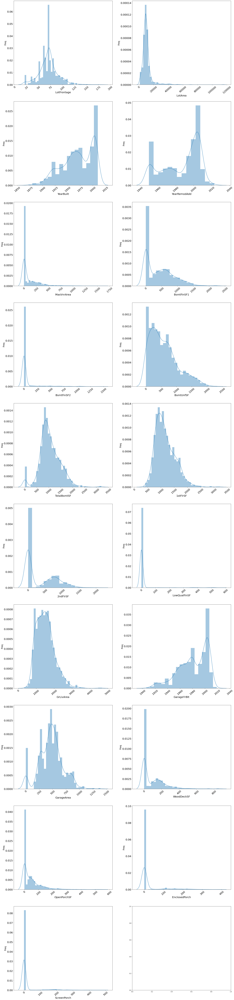

In [30]:
def normal_distribution(df,num):
    
    i=0
    j=0
    len_outlier_col=len(num)
    col=round(len_outlier_col/2)
    fig, ax1 = plt.subplots(col,2,figsize=(30,140))
    for itr in  num:
#     plt.figure(figsize=(20,68))
        sns.distplot(df[itr],ax=ax1[j,i])
        ax1[j,i].tick_params(axis="x", labelsize=20,rotation=40) 
        ax1[j,i].tick_params(axis="y", labelsize=20) 
        ax1[j,i].set_xlabel(itr, fontsize = 20)
        ax1[j,i].set_ylabel("Freq", fontsize = 17)
        if i==1:
            j+=1
            i=0
        else:
            i=i+1
    plt.show()
    
    
con=continous(df)
normal_distribution(x,con)

In [31]:
def cat_variable(df):
    num=df.select_dtypes(exclude='object')
    cat=df.select_dtypes(include='object')
    cat=cat.columns
    num=num.columns
    continous=[]
    discrete=[]
    dic={}
    dic['category']=cat

    for itr in num:
        if df[itr].nunique()>15:
    #         print(df[itr].nunique())
            continous.append(itr)
        else:
            discrete.append(itr)
    dic['continous']=continous
    dic['discrete']=discrete
    return dic
cat_va=cat_variable(x)
print(cat_va['continous'])

['Dwell_Type', 'LotFrontage', 'LotArea', 'Neighborhood', 'YearBuilt', 'YearRemodAdd', 'Exterior2nd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'GarageYrBlt', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'MiscVal']


In [32]:
#Converting skew data into log
from scipy.stats import skew
def change_skewness(x):
    #we are just doing it cuz its a good practice its not an assumption
    #finding the skewness in each variable
    data_num_skew = x.apply(lambda i: skew(i.dropna()))
    #subsetting the variables that are highly skewed
    data_num_skewed = data_num_skew[(data_num_skew > .75) | (data_num_skew < -.75)]

    print(data_num_skew)
    print(data_num_skewed)
    # apply log + 1 transformation for all numeric features with skewness over .75 to avoid infinty values in case of 0 values
    x[data_num_skewed.index] = np.log1p(x[data_num_skewed.index])
change_skewness(x)

Dwell_Type         1.417954
Zone_Class        -1.653631
LotFrontage        0.459654
LotArea            4.998877
Property_Shape    -0.604067
LandContour       -3.096247
LotConfig         -1.103084
LandSlope          4.824952
Neighborhood       0.040220
Condition1         3.349867
Condition2        11.491628
Dwelling_Type      2.196186
HouseStyle         0.294560
OverallQual        0.150082
OverallCond        0.666204
YearBuilt         -0.527101
YearRemodAdd      -0.588338
RoofStyle          1.415601
RoofMatl           8.805196
Exterior1st       -0.728145
Exterior2nd       -0.715436
MasVnrType        -0.063218
MasVnrArea         2.597187
ExterQual         -1.766044
ExterCond         -2.539920
Foundation         0.045512
BsmtQual          -1.267442
BsmtCond          -3.536903
BsmtExposure      -1.230969
BsmtFinType1      -0.086274
BsmtFinSF1         0.839813
BsmtFinType2      -3.682909
BsmtFinSF2         4.237291
BsmtUnfSF          0.886578
TotalBsmtSF        0.420523
Heating            9

<b><div id='3'>Assumption 3: Assumption of Normality: The dependent variable should follow an approximate normal distribtion</div></b>

<AxesSubplot:xlabel='Property_Sale_Price', ylabel='Density'>

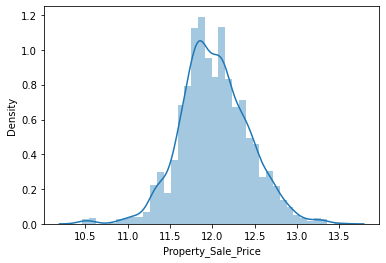

In [33]:
#Using log to make it normally distributed
sns.distplot(np.log(y))

In [34]:
y=np.log(y)

<div id ='4'><b>Assumption 4: Assumption of no multicollinearity</b></div>

In [35]:
#Checking for Multicolinearity
#VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor as vif
def VIF(x):

    vif_df = pd.DataFrame()
    vif_df["features"] = x.columns
    vif_df["VIF Factor"] = [vif(x.values, i) for i in range(x.shape[1])]
    return vif_df.round(2).sort_values(by = 'VIF Factor',ascending=False)

In [36]:
vi=VIF(x).head(1)
vi['features'].values

array(['YrSold'], dtype=object)

In [37]:
"""
def drop_col(x):
    
    vi=VIF(x).head(1)
    i=1
    while vi["VIF Factor"].values>10:
        print(vi['features'],':-',vi["VIF Factor"])
        a=input("Press N to say no:-")
        if a=='N':
            i=i+1
            print(VIF(x))
            continue
        else:
            x.drop(vi['features'],axis=1,inplace=True)
        vi=VIF(x).head(i)
drop_col(x)   
"""

'\ndef drop_col(x):\n    \n    vi=VIF(x).head(1)\n    i=1\n    while vi["VIF Factor"].values>10:\n        print(vi[\'features\'],\':-\',vi["VIF Factor"])\n        a=input("Press N to say no:-")\n        if a==\'N\':\n            i=i+1\n            print(VIF(x))\n            continue\n        else:\n            x.drop(vi[\'features\'],axis=1,inplace=True)\n        vi=VIF(x).head(i)\ndrop_col(x)   \n'

In [38]:
def drop_col(x):
    
    vi=VIF(x).head(1)
    i=1
    while vi["VIF Factor"].values>10:
        print(vi['features'],':-',vi["VIF Factor"])
        
        x.drop(vi['features'],axis=1,inplace=True)
        vi=VIF(x).head(i)
drop_col(x)        

69    YrSold
Name: features, dtype: object :- 69    38108.26
Name: VIF Factor, dtype: float64
16    YearRemodAdd
Name: features, dtype: object :- 16    19852.27
Name: VIF Factor, dtype: float64
41    GrLivArea
Name: features, dtype: object :- 41    14829.82
Name: VIF Factor, dtype: float64
52    GarageYrBlt
Name: features, dtype: object :- 52    11969.85
Name: VIF Factor, dtype: float64
15    YearBuilt
Name: features, dtype: object :- 15    2839.09
Name: VIF Factor, dtype: float64
37    1stFlrSF
Name: features, dtype: object :- 37    1302.0
Name: VIF Factor, dtype: float64
3    LotArea
Name: features, dtype: object :- 3    461.78
Name: VIF Factor, dtype: float64
9    Condition2
Name: features, dtype: object :- 9    273.87
Name: VIF Factor, dtype: float64
52    GarageCond
Name: features, dtype: object :- 52    150.49
Name: VIF Factor, dtype: float64
0    Dwell_Type
Name: features, dtype: object :- 0    144.2
Name: VIF Factor, dtype: float64
26    BsmtFinType2
Name: features, dtype: obje

<AxesSubplot:>

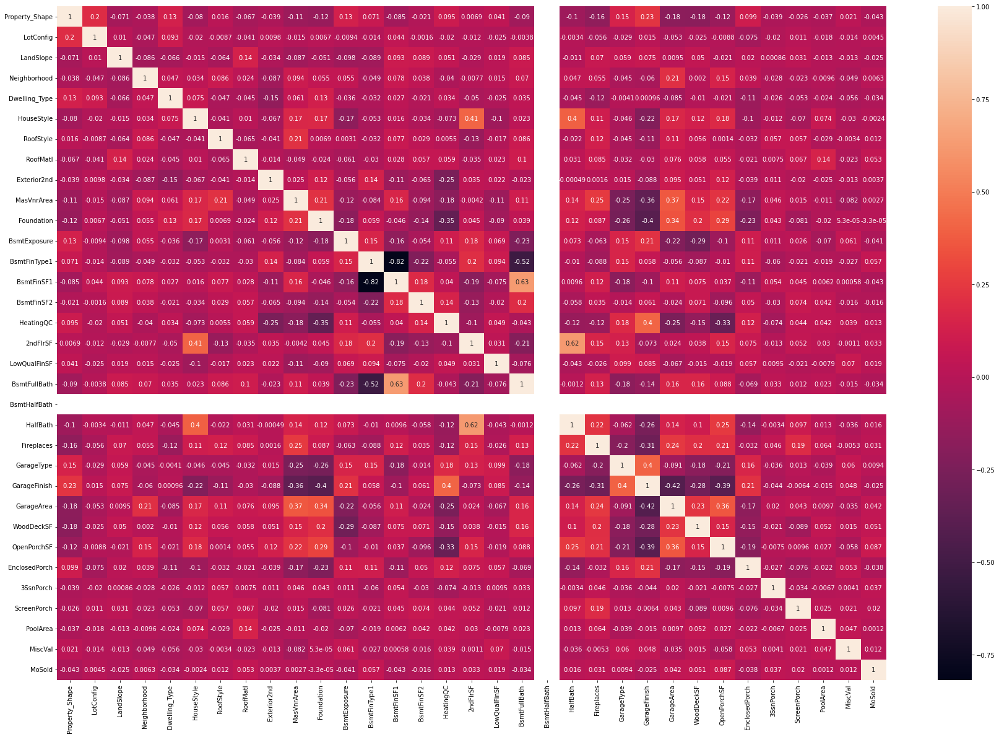

In [39]:
plt.figure(figsize=(30,20))
sns.heatmap(x.corr(),annot=True)

<b>Note</b>:-drop any one columns in whihc you see multicolinearity if you dont wanna go with vif

<h3>Scaling the data</h3>

In [40]:
from sklearn.preprocessing import StandardScaler
#x:-scaling the dataframe
def scale(x):
    scaler = StandardScaler()
    x1 = scaler.fit_transform(x)
    x=pd.DataFrame(x1,columns=x.columns)
    return x.head()
scale(x)

,Property_Shape,LotConfig,LandSlope,Neighborhood,Dwelling_Type,HouseStyle,RoofStyle,RoofMatl,Exterior2nd,MasVnrArea,Foundation,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,HeatingQC,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,HalfBath,Fireplaces,GarageType,GarageFinish,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold
0,0.750848,0.589983,-0.225769,-1.217149,-0.437196,1.046149,-0.490477,-0.119755,0.738061,1.220603,0.793176,0.576409,-0.449281,0.811019,-0.341269,-0.882076,1.189806,-0.140668,1.070876,0.0,1.244720,-0.948989,-0.689958,-0.277025,0.340521,-0.934281,0.841127,-0.401997,-0.120088,-0.281977,-0.055846,-0.188639,-1.600294
1,-1.369776,0.589983,-0.225769,-1.217149,-0.437196,1.046149,-0.490477,-0.119755,0.738061,1.148057,0.793176,0.007275,-0.449281,0.687415,-0.341269,-0.882076,1.194037,-0.140668,1.070876,0.0,1.244720,0.634575,-0.689958,-0.277025,0.621058,-0.934281,0.670973,-0.401997,-0.120088,-0.281977,-0.055846,-0.188639,1.017364
2,-1.369776,-1.938765,-0.225769,-1.050479,-0.437196,1.046149,-0.490477,-0.119755,1.305168,-0.802450,-1.966132,0.576409,-1.533966,0.419372,-0.341269,0.263346,1.152851,-0.140668,1.070876,0.0,-0.769596,0.634575,1.554822,0.954269,0.780030,-0.934281,0.588354,2.864274,-0.120088,-0.281977,-0.055846,-0.188639,-1.600294
3,-1.369776,-0.212626,-0.225769,0.449551,-0.437196,1.046149,-0.490477,-0.119755,0.738061,1.441772,0.793176,-2.166158,-0.449281,0.786193,-0.341269,-0.882076,1.253326,-0.140668,1.070876,0.0,1.244720,0.634575,-0.689958,-0.277025,1.687101,1.097387,0.987838,-0.401997,-0.120088,-0.281977,-0.055846,-0.188639,2.139217
4,-1.369776,0.589983,-0.225769,-0.217129,-0.437196,-1.603564,-0.490477,-0.119755,0.738061,-0.802450,4.932138,0.576409,-0.449281,0.822994,-0.341269,-0.882076,1.065120,-0.140668,1.070876,0.0,1.244720,-0.948989,-0.689958,0.954269,0.022578,0.499348,0.518824,-0.401997,9.250829,-0.281977,-0.055846,5.322788,1.391315


<div id='st2'><b>Step 2:- Splitting the data into train and test(validation)</b></div>

In [41]:
from sklearn.model_selection import  train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=10)
print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

(1543, 33)
(1543,)
(386, 33)
(386,)


<div id='st3'><b>Step 3:-Building the model</b></div>

In [42]:
from sklearn.linear_model import LinearRegression
lm=LinearRegression()
#train the model
lm.fit(x_train,y_train)
print(lm.intercept_)
print(lm.coef_)
# print(list(zip(x.columns,lm.coef_)))

11.438920683913699
[-1.86180742e-02 -8.13747366e-03 -1.86886328e-03  3.32441328e-03
 -2.25757992e-02 -9.99237901e-03  1.17457529e-01  6.96907425e-02
  3.02697459e-03  1.13523539e-02  5.12048776e-02 -5.69487092e-02
  8.21669351e-03  1.66443665e-02 -1.12116596e-03 -3.57598321e-02
  2.04042485e-02 -2.93726958e-03  1.26641081e-02  1.90819582e-17
  3.56785244e-02  1.17550751e-01 -6.97042039e-02 -4.53321601e-02
  6.48494068e-04  9.12150917e-03  2.09843203e-02  4.28846914e-03
  7.89124745e-03  1.71524514e-02  5.32917917e-02 -7.21961444e-03
  2.84663403e-03]


In [43]:
lm.score(x_test,y_test)

0.7604452719674661

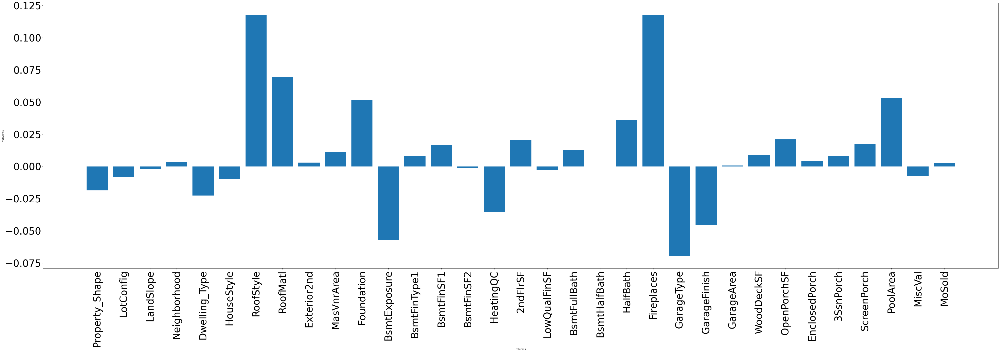

In [44]:
#how indiviual variable have infuence on the target variable
def check_coef(x_train,lm):
    coef_df=pd.DataFrame()
    coef_df["Column name"]=x_train.columns
    coef_df['coef_value']=pd.Series(lm.coef_)
    plt.figure(figsize=(70,20))
    plt.xticks(fontsize=40,rotation=90)
    plt.xlabel("columns")
    plt.ylabel("Frequency")
    plt.yticks(fontsize=40)
    plt.bar(coef_df["Column name"],coef_df['coef_value'])
    plt.show()
check_coef(x_train,lm)

<div id="st4"><b>Step 4:-Regularization</b></div>
<pre>
<a>Ridge(L1)</a>
-Hyper parameter tunning:-
loop method
random-search-cv
grid-search-cv
<a>Lasso(L2)</a>
<a>Elastic</a>
<a>SGD</a>
</pre>

<b>Ridge</b>

<h3>1)Loop method</h3>

In [45]:
from sklearn.linear_model import Ridge,ElasticNet
for itr in np.arange(0,10,0.1):
    Ridge_reg=Ridge(alpha=itr)
    #train the model
    Ridge_reg.fit(x_train,y_train)
    score=Ridge_reg.score(x_test,y_test)
    
    print(itr," :- ",score)

0.0  :-  0.7604273927378229
0.1  :-  0.7604338274518199
0.2  :-  0.760422384587512
0.30000000000000004  :-  0.7604109433992154
0.4  :-  0.7603995039111248
0.5  :-  0.7603880661469682
0.6000000000000001  :-  0.7603766301300156
0.7000000000000001  :-  0.7603651958830862
0.8  :-  0.7603537634285579
0.9  :-  0.7603423327883734
1.0  :-  0.7603309039840507
1.1  :-  0.760319477036689
1.2000000000000002  :-  0.760308051966977
1.3  :-  0.7602966287952004
1.4000000000000001  :-  0.760285207541249
1.5  :-  0.7602737882246234
1.6  :-  0.7602623708644436
1.7000000000000002  :-  0.7602509554794545
1.8  :-  0.7602395420880329
1.9000000000000001  :-  0.7602281307081946
2.0  :-  0.7602167213576004
2.1  :-  0.7602053140535632
2.2  :-  0.7601939088130534
2.3000000000000003  :-  0.7601825056527058
2.4000000000000004  :-  0.7601711045888251
2.5  :-  0.7601597056373923
2.6  :-  0.7601483088140698
2.7  :-  0.7601369141342086
2.8000000000000003  :-  0.7601255216128515
2.9000000000000004  :-  0.760114131264741

<pre>
Hyper-Parameters
<b>alpha</b>:-
</pre>

<h3>2)RandomizedSearchCV</h3>

In [46]:
from sklearn.model_selection import RandomizedSearchCV
alp=np.arange(0,10,0.01)
random_grid={"alpha":alp}
Ridge_reg=Ridge()
rv_random_cv=RandomizedSearchCV(estimator=Ridge_reg,param_distributions=random_grid,n_iter=300,cv=3,verbose=True,n_jobs=-1)
rv_random_cv.fit(x_train,y_train)

Fitting 3 folds for each of 300 candidates, totalling 900 fits


RandomizedSearchCV(cv=3, estimator=Ridge(), n_iter=300, n_jobs=-1,
                   param_distributions={'alpha': array([0.  , 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 ,
       0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21,
       0.22, 0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32,
       0.33, 0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43,
       0.44, 0.45, 0.46, 0.47, 0.48, 0.49, 0.5 , 0.5...
       9.24, 9.25, 9.26, 9.27, 9.28, 9.29, 9.3 , 9.31, 9.32, 9.33, 9.34,
       9.35, 9.36, 9.37, 9.38, 9.39, 9.4 , 9.41, 9.42, 9.43, 9.44, 9.45,
       9.46, 9.47, 9.48, 9.49, 9.5 , 9.51, 9.52, 9.53, 9.54, 9.55, 9.56,
       9.57, 9.58, 9.59, 9.6 , 9.61, 9.62, 9.63, 9.64, 9.65, 9.66, 9.67,
       9.68, 9.69, 9.7 , 9.71, 9.72, 9.73, 9.74, 9.75, 9.76, 9.77, 9.78,
       9.79, 9.8 , 9.81, 9.82, 9.83, 9.84, 9.85, 9.86, 9.87, 9.88, 9.89,
       9.9 , 9.91, 9.92, 9.93, 9.94, 9.95, 9.96, 9.97, 9.98, 9.99])},
                   verbose=True)

In [47]:
rv_random_cv.best_params_

{'alpha': 9.99}

In [48]:
Ridge_reg=Ridge(alpha=9.98)
#train the model
Ridge_reg.fit(x_train,y_train)
# print(Ridge.intercept_)
# print(Ridge.coef_)
# print(list(zip(x.columns,Ridge.coef_)))
score=Ridge_reg.score(x_test,y_test)
print(score)

0.7593138598863214


<h3>3)GridSearchCV</h3>

In [49]:
from sklearn.model_selection import GridSearchCV
alp=np.arange(8,10,0.001)
random_grid={"alpha":alp}
Ridge_reg=Ridge()
rv_grid_cv=GridSearchCV(estimator=Ridge_reg,param_grid=random_grid,cv=10,verbose=True,n_jobs=-1)
rv_grid_cv.fit(x_train,y_train)

Fitting 10 folds for each of 2000 candidates, totalling 20000 fits


GridSearchCV(cv=10, estimator=Ridge(), n_jobs=-1,
             param_grid={'alpha': array([8.   , 8.001, 8.002, ..., 9.997, 9.998, 9.999])},
             verbose=True)

In [50]:
rv_grid_cv.best_params_

{'alpha': 9.998999999998892}

In [51]:
Ridge_reg=Ridge(alpha= 9.998999999998892)
#train the model
Ridge_reg.fit(x_train,y_train)
# print(Ridge.intercept_)
# print(Ridge.coef_)
# print(list(zip(x.columns,Ridge.coef_)))
score=Ridge_reg.score(x_test,y_test)
print(score)

0.7593117297669875


In [52]:
#not much used 
Ridge_reg=ElasticNet()
#train the model
Ridge_reg.fit(x_train,y_train)
# print(Ridge.intercept_)
# print(Ridge.coef_)
# print(list(zip(x.columns,Ridge.coef_)))
score=Ridge_reg.score(x_test,y_test)
print(score)

0.3735280946595775


<h3>Lasso</h3>

In [53]:
from sklearn.linear_model import Lasso
for itr in np.arange(0,10,0.1):
    Lasso_reg=Lasso(alpha=itr)
    #train the model
    Lasso_reg.fit(x_train,y_train)
    Score=Lasso_reg.score(x_test,y_test)
    print(itr,":-",Lasso_reg.score(x_test,y_test))
# print(Lasso.intercept_)
# print(Lasso.coef_)
# print(list(zip(x.columns,Lasso.coef_)))

0.0 :- 0.7604452719674667
0.1 :- 0.5472529371044886
0.2 :- 0.39370267406333004
0.30000000000000004 :- 0.3733987428416503
0.4 :- 0.3734644998762978
0.5 :- 0.37352771184917233
0.6000000000000001 :- 0.3735883787602744
0.7000000000000001 :- 0.37364650060960347
0.8 :- 0.3737020773971609
0.9 :- 0.3737551091229454
1.0 :- 0.37380559578695727
1.1 :- 0.37385353738919713
1.2000000000000002 :- 0.373898933929664
1.3 :- 0.37394178540835876
1.4000000000000001 :- 0.3739820918252804
1.5 :- 0.3740198531804303
1.6 :- 0.3740550694738072
1.7000000000000002 :- 0.37408774070541195
1.8 :- 0.3741178668752444
1.9000000000000001 :- 0.37414544798330374
2.0 :- 0.37417048402959097
2.1 :- 0.37419297501410553
2.2 :- 0.37421292093684755
2.3000000000000003 :- 0.3742303217978169
2.4000000000000004 :- 0.3742451775970145
2.5 :- 0.37425748833443884
2.6 :- 0.3742672540100912
2.7 :- 0.3742744746239707
2.8000000000000003 :- 0.37427915017607793
2.9000000000000004 :- 0.3742812806664122
3.0 :- 0.37428086609497513
3.1 :- 0.374277

<div id="SGD"><b>3)SGDregression</b></div>

In [54]:

from sklearn.linear_model import SGDRegressor
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
scaler.fit(x)
X=scaler.transform(x)
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=1)
reg=SGDRegressor()
reg.fit(x_train,y_train)
reg.score(x_test,y_test)

0.7590874171007722

In [55]:
reg=SGDRegressor()
di={"penalty":['l2','l1'],
    "alpha":np.arange(0,10,0.01),
    "max_iter":[100,1000,10000],
    "eta0":[0.01,0.001,0.0001,0.00001],
    
    "n_iter_no_change":np.arange(0,100,5),
}
rv_random_cv=RandomizedSearchCV(estimator=reg,param_distributions=di,n_iter=190,cv=5,verbose=True,n_jobs=-1)
rv_random_cv.fit(x_train,y_train)

Fitting 5 folds for each of 190 candidates, totalling 950 fits


RandomizedSearchCV(cv=5, estimator=SGDRegressor(), n_iter=190, n_jobs=-1,
                   param_distributions={'alpha': array([0.  , 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 ,
       0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21,
       0.22, 0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32,
       0.33, 0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43,
       0.44, 0.45, 0.46, 0.47, 0.48, 0.49,...
       9.57, 9.58, 9.59, 9.6 , 9.61, 9.62, 9.63, 9.64, 9.65, 9.66, 9.67,
       9.68, 9.69, 9.7 , 9.71, 9.72, 9.73, 9.74, 9.75, 9.76, 9.77, 9.78,
       9.79, 9.8 , 9.81, 9.82, 9.83, 9.84, 9.85, 9.86, 9.87, 9.88, 9.89,
       9.9 , 9.91, 9.92, 9.93, 9.94, 9.95, 9.96, 9.97, 9.98, 9.99]),
                                        'eta0': [0.01, 0.001, 0.0001, 1e-05],
                                        'max_iter': [100, 1000, 10000],
                                        'n_iter_no_change': array([ 0,  5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80,
       85, 90, 95]),
                                        'penalty': ['l2', 'l1']},
                   verbose=True)

In [56]:
rv_random_cv.best_estimator_

SGDRegressor(alpha=0.0, max_iter=100, n_iter_no_change=95)

In [72]:
reg=SGDRegressor(alpha=0.01, eta0=0.001, max_iter=100000, n_iter_no_change=70,warm_start=True)


In [73]:
reg.fit(x_train,y_train)


SGDRegressor(alpha=0.01, eta0=0.001, max_iter=100000, n_iter_no_change=70,
             warm_start=True)

In [74]:
reg.score(x_test,y_test)

0.762148085500798

<div id='st5'><h3>Step 5:-Evaluation of regresion</h3></div>

R-squared: -2.0057547887366276
RMSE: 0.7234396086355542
Adj R-square: -2.0580977481183207
       Id  Actual sales  Predicted sales     Error
0      55     11.775290        11.442798  0.332491
1    1370     12.354493        11.442394  0.912099
2    1244     13.049793        11.444405  1.605388
3    1003     12.354493        11.444255  0.910238
4     334     12.240474        11.442290  0.798184
5     678     11.603680        11.440879  0.162801
6     416     12.106992        11.441781  0.665211
7    1686     11.648330        11.442544  0.205786
8    1712     11.191342        11.441151  0.249809
9    1696     11.074421        11.440740  0.366320
10   1405     11.561716        11.444902  0.116813
11    433     11.715866        11.442035  0.273831
12    695     11.860055        11.442821  0.417234
13    808     12.317167        11.442544  0.874623
14    895     11.685685        11.441804  0.243881
15    854     11.970350        11.443220  0.527130
16   1673     12.254863        11.442382  0

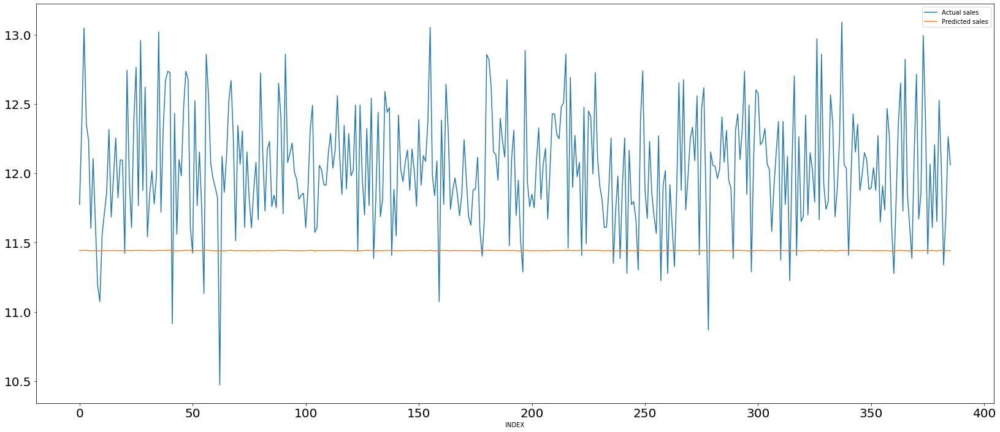

In [58]:
from sklearn.metrics import r2_score,mean_squared_error
import numpy as np
from Evaluation import Evaluation
Evaluation=Evaluation(x_test,y_test,x,y)
data=Evaluation.regression(Ridge_reg)
Y_PRED=Ridge_reg.predict(x_test)
print(data)

<div id='6'><b>Assumption 6: Errors should be random-->Fitted v/s Residual plot</b></div>

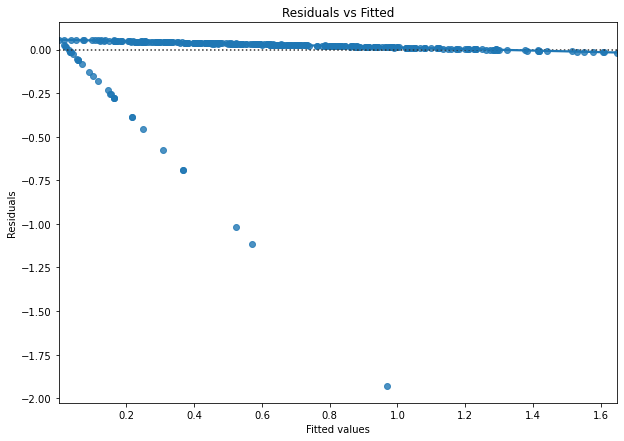

In [59]:
#Assumption: Errors should be random
#checked using Residual v/s Fitted plot
 
import matplotlib.pyplot as plt
def random(data):
    plot_lm_1 = plt.figure(1)
    plot_lm_1.set_figheight(7)
    plot_lm_1.set_figwidth(10)

    # fitted values (need a constant term for intercept)
    model_fitted_y = data['Error']
    plot_lm_1.axes[0] = sns.residplot(model_fitted_y,data['Actual sales']  ,lowess=True)

    plot_lm_1.axes[0].set_title('Residuals vs Fitted')
    plot_lm_1.axes[0].set_xlabel('Fitted values')
    plot_lm_1.axes[0].set_ylabel('Residuals')
random(data)

<b>Note</b>:-Error shld be random

<div id='7'><b>Assumption 7: Errors should follow an approx normal distribution-->Normal QQ plot</b>,</div>

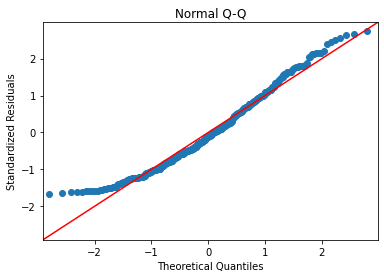

<AxesSubplot:xlabel='Error', ylabel='Density'>

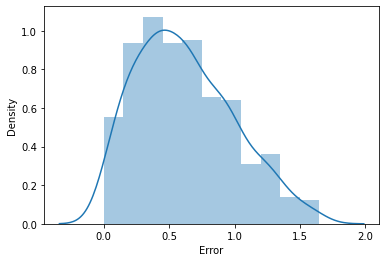

In [60]:
#Assumption: Errors should follow a approximate normal distribution
#checked using Normal QQ plot
 

import statsmodels.api as stm
import scipy.stats as stats
def normal(data):
    
    res=data['Error']
    fig = stm.qqplot(res,  fit=True, line='45')
    plt.title('Normal Q-Q')
    plt.xlabel('Theoretical Quantiles')
    plt.ylabel('Standardized Residuals')
    plt.show()
    
normal(data)
sns.distplot(data['Error'])

<b>Note</b>:-The error points shld follow the red diagnol line to indicate that they follow a std normal distribution

<div id='8'><b>Assumption 8: Errors should should follow a constant variance(Homoskedasticity)-->Scale Location plot</b></div>

In [61]:
#Assumption: Errors should follow a constant variance-->Homoskedasticity
#checked using Scale location plot
 
# normalized residuals
model_norm_residuals = data['Error']
# absolute squared normalized residuals
model_norm_residuals_abs_sqrt = np.sqrt(np.abs(model_norm_residuals))
 
plot_lm_3 = plt.figure(3)
plot_lm_3.set_figheight(8)
plot_lm_3.set_figwidth(12)
plt.scatter(model_fitted_y, model_norm_residuals_abs_sqrt, alpha=0.5)
sns.regplot(model_fitted_y, model_norm_residuals_abs_sqrt, lowess=True)
 

plot_lm_3.axes[0].set_title('Scale-Location')
plot_lm_3.axes[0].set_xlabel('Fitted values')
plot_lm_3.axes[0].set_ylabel('$\sqrt{|Standardized Residuals|}$')

NameError: name 'model_fitted_y' is not defined

<Figure size 864x576 with 0 Axes>